In [1]:
from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray as xr
import xbout
from pathlib import Path
import xhermes as xh

sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/sdtools"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/transients"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions"))

from heatflux_functions import * 

from plotting_functions import *
from convergence_functions import * 

from hermes3.case_db import *
from hermes3.casedeck import*
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *
from hermes3.utils import *
from hermes3.fluxes import *
from hermes3.selectors import *

# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10



# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})



%load_ext autoreload
%autoreload 2


In [2]:


def replace_guards(var):
    """
	This in-place replaces the points in the guard cells with the points on the boundary
    
    """
    # Strip the edge guard cells
    var = var[1:-1]

    var[0] = 0.5*(var[0] + var[1])
    var[-1] = 0.5*(var[-1] + var[-2])
    return var

In [3]:
import scipy.integrate

def divq_integrate(dataframe, snb_int = False):
    """
    Calculate the total heat flux from the divergence of the Spitzer-Harm fluxes.
    If snb == True outputs integral of divq_snb, otherwise outputs integral of divq_sh.
    """

    x = np.ravel(dataframe['y'].values)[1:-1]
    Te = np.ravel(dataframe['Te'].values)


    div_q_snb = replace_guards(np.ravel(dataframe['Div_Q_SNB'].values))
    div_q_sh = replace_guards(np.ravel(dataframe['Div_Q_SH'].values))

    print('x =' , len(x))
    print('div_q_snb = ' , len(div_q_snb))

    q_snb = scipy.integrate.cumulative_trapezoid(div_q_snb, x, initial=0)
    q_sh = scipy.integrate.cumulative_trapezoid(div_q_sh, x, initial=0)

    if snb_int == False:
        return q_sh
    else:
        return q_snb

In [4]:
def spitzer_q(dataframe):
    
    x = dataframe['y']
    Te = dataframe['Te']
    Ti = dataframe['Td+']
    Ne = dataframe['Ne']
    Ni = dataframe['Nd+']
    kappa_e = dataframe['kappa_par_e']
    kappa_i = dataframe['kappa_par_d+']

    # print(kappa_e)

    grad_T = np.gradient(Te, x)
    q = -kappa_e * grad_T

    return q

In [5]:

alpha_vals = [-1, 0.2, 0.06, 'snb']
neon_vals = [0.0, 0.01, 0.02, 0.03, 0.032,0.034,0.036,0.038, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
parent_dir = '/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/updated_flux_limitation/2025-04_selective_revisions/2024-03-25_wigram_reference_glover_comparison_FINAL_restart_selective_collisions/Long_runs'
# parent_dir = '/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/updated_flux_limitation/2025-04_selective_revisions/2024-03-25_wigram_reference_glover_comparison_FINAL_restart_selective_collisions/Long_runs/fixing_flooring'

cs = dict()


for alpha in alpha_vals:
    for neon in neon_vals:
        name = f"alpha_{alpha}_neon_{neon}"
        print(f"Loading {name}")
        cs[name] = Load.case_1D(f'{parent_dir}/alpha_{alpha}/neon_{neon}', guard_replace = False, use_squash=True)


Loading alpha_-1_neon_0.0
- Looking for squash file
- Squash file found. squash date 04/20/2025, 15:13:42, dmp file date 04/19/2025, 00:54:56
Skipping unnormalisation
Loading alpha_-1_neon_0.01
- Looking for squash file
- Squash file found. squash date 04/20/2025, 15:13:54, dmp file date 04/19/2025, 04:33:05
Skipping unnormalisation
Loading alpha_-1_neon_0.02
- Looking for squash file
- Squash file found. squash date 04/20/2025, 15:14:06, dmp file date 04/19/2025, 07:06:33
Skipping unnormalisation
Loading alpha_-1_neon_0.03
- Looking for squash file
- Squash file found. squash date 04/20/2025, 15:14:18, dmp file date 04/19/2025, 08:45:03
Skipping unnormalisation
Loading alpha_-1_neon_0.032
- Looking for squash file
- Squash file found. squash date 04/29/2025, 11:01:43, dmp file date 04/29/2025, 11:01:31
Skipping unnormalisation
Loading alpha_-1_neon_0.034
- Looking for squash file
- Squash file found. squash date 04/29/2025, 11:02:00, dmp file date 04/29/2025, 11:01:45
Skipping unnorma

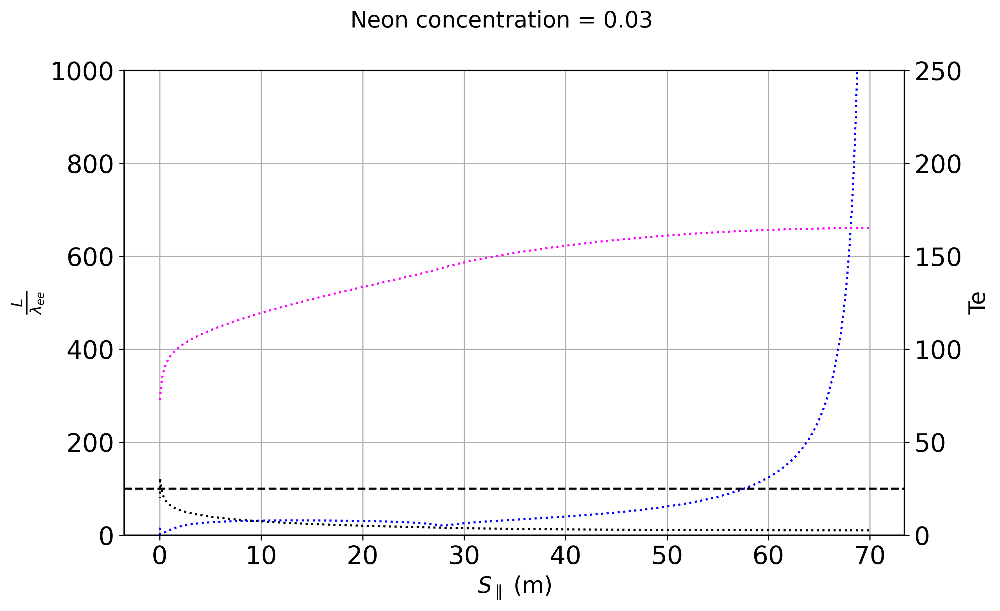

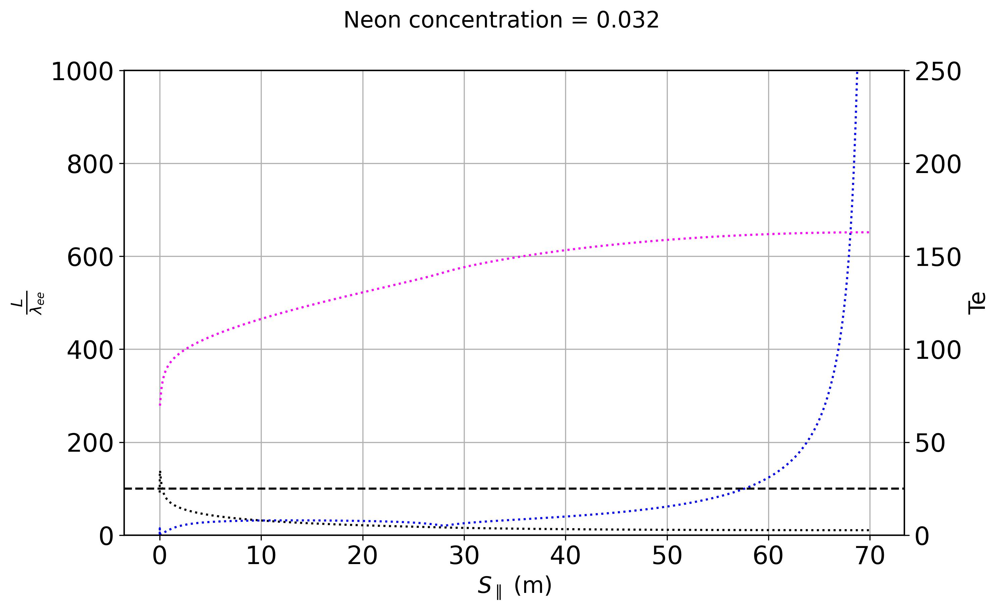

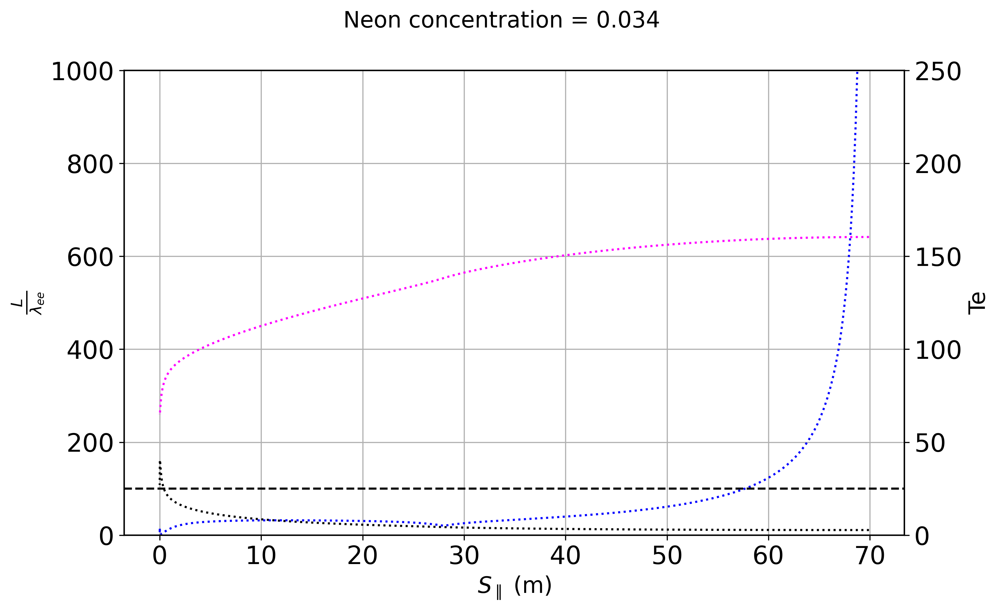

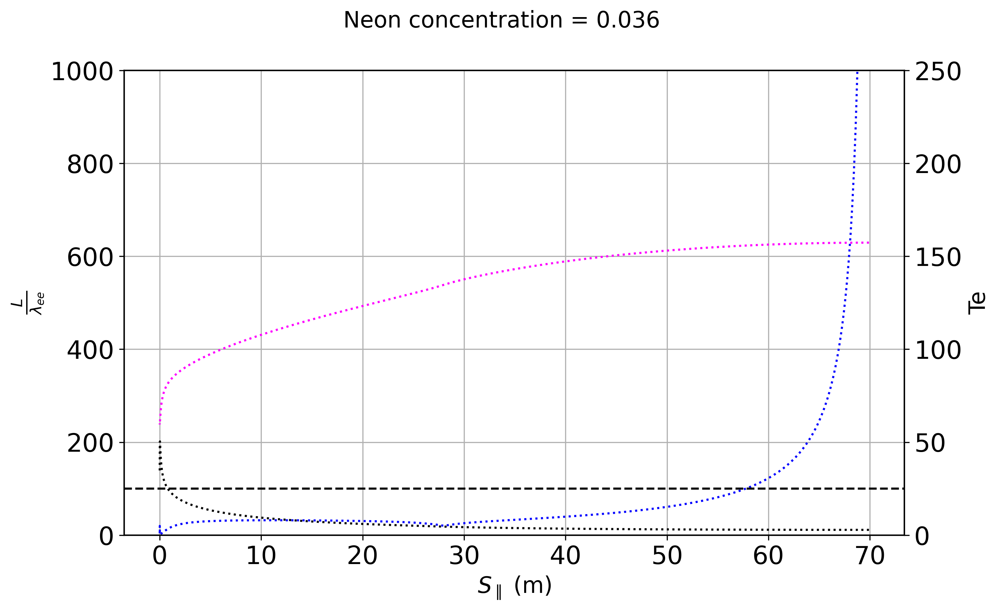

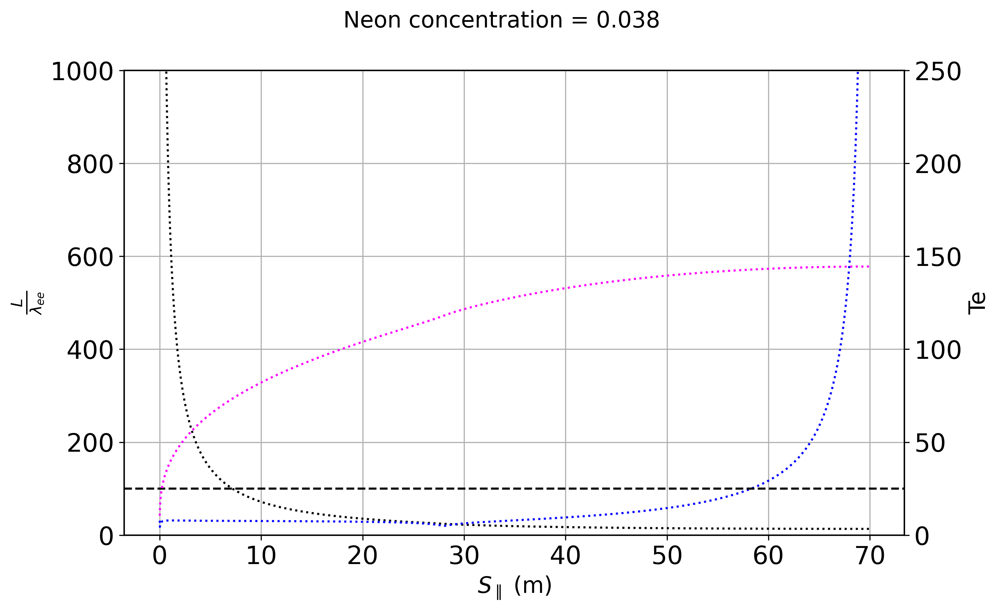

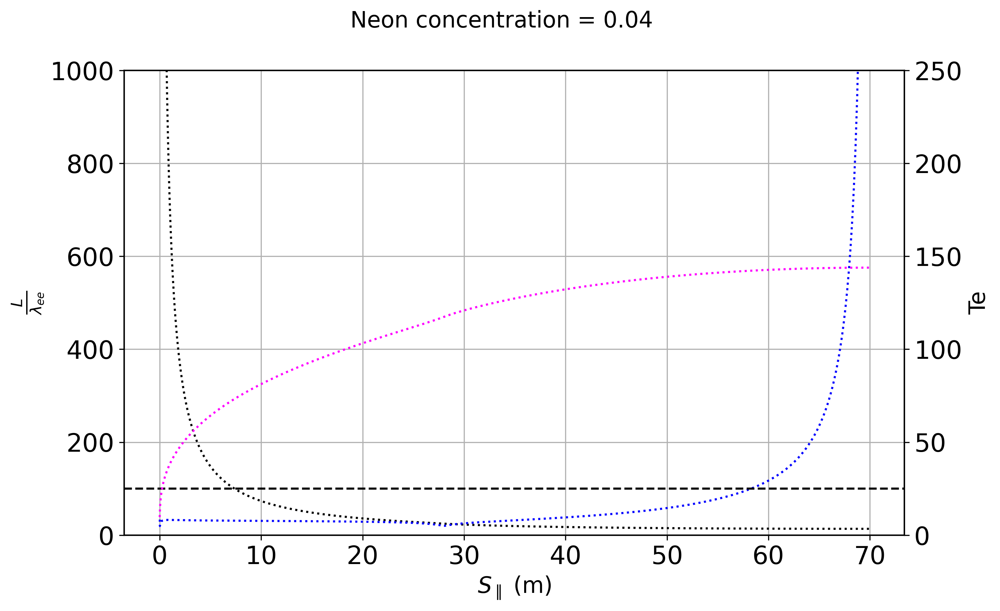

In [6]:
# index = 4
# neon_vals = np.array([0.0,0.01,0.02,0.03,0.04,0.05,0.06, 0.07,0.08,0.09, 0.1])
neon_vals = np.array([0.03,0.032,0.034,0.036,0.038, 0.04])

for i in neon_vals:
    fig,ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)
    ax2 = ax.twinx()
    for j in alpha_vals:

        if j == -1:
            label = 'SH'
            linestyle = '--'
            color = 'red'
        elif j == 0.2:
            label = j
            linestyle = '-'
            color = 'blue'
        elif j == 0.06:
            label = j
            linestyle = '-'
            color = 'black'
        elif j == 'snb':
            label = j
            linestyle = ':'
            color = 'magenta'

        if j == 'snb':
            Te = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'].values[2:-2]
            Ne = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'].values[2:-2]

            lambda_ee = ((Te**2) * 10**(16) / Ne)
            y_flipped = (cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['y'].values[2:-2].max() - cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['y'].values[2:-2])

            ds_coll = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)
            Ne = ds_coll['Ne'].values[2:-2]
            Lt = np.abs(Te/np.gradient(Te, ds_coll['y'].values[2:-2]))
            Ls = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['y'].values[2:-2])

            Lt_over_lambda = (Lt/lambda_ee)

            l_over_lambda = (Ls/lambda_ee)
            ax.plot(y_flipped, l_over_lambda, linestyle=linestyle, color='black', label=r'$\frac{L}{\lambda_{ee}}$', markersize=5)
            ax.plot(y_flipped, Lt_over_lambda, linestyle=linestyle, color='blue', label=r'$\frac{L_t}{\lambda_{ee}}$', markersize=5)
            ax2.plot(y_flipped, Te, linestyle=linestyle, color=color, label=f'Te', markersize=5)
            ax.axhline(100, color='black', linestyle='--')
            ax.set_xlabel('$S_{\parallel}$ (m)')
            ax.set_ylabel(r'$\frac{L}{\lambda_{ee}}$')
            # ax.set_yscale('log')
            ax.set_ybound(0, 1e3)
            ax2.set_ybound(0, 250)

            ax2.set_ylabel('Te')
            # ax.set_xscale('log')
            ax2.grid(False)
            # fig.legend(loc='upper right', ncol=len(labels), bbox_to_anchor=(0.5, 1.06))
            fig.suptitle(f'Neon concentration = {i}', fontsize=16)

    # plt.close()

    # lambda_ee = ((Te**2) * 10**(16) / Ne)
    # knudsen_list.append(lambda_ee/Lt)
    # inv_knudsen_list.append(Lt/lambda_ee)

    # l_over_lambda = np.min((Ls/lambda_ee))

# l_over_lambda = (Ls/lambda_ee)[4]

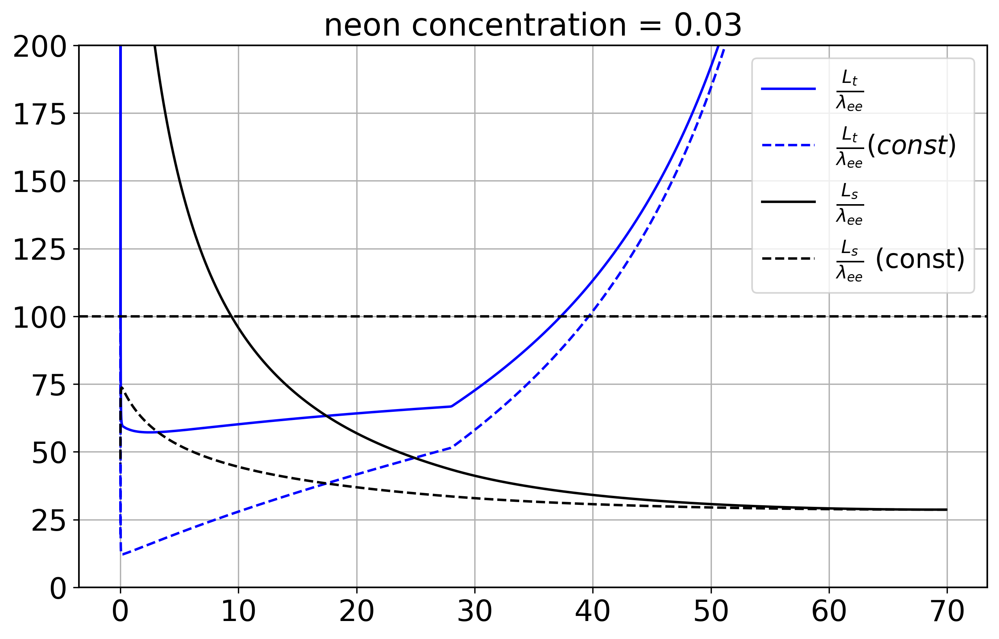

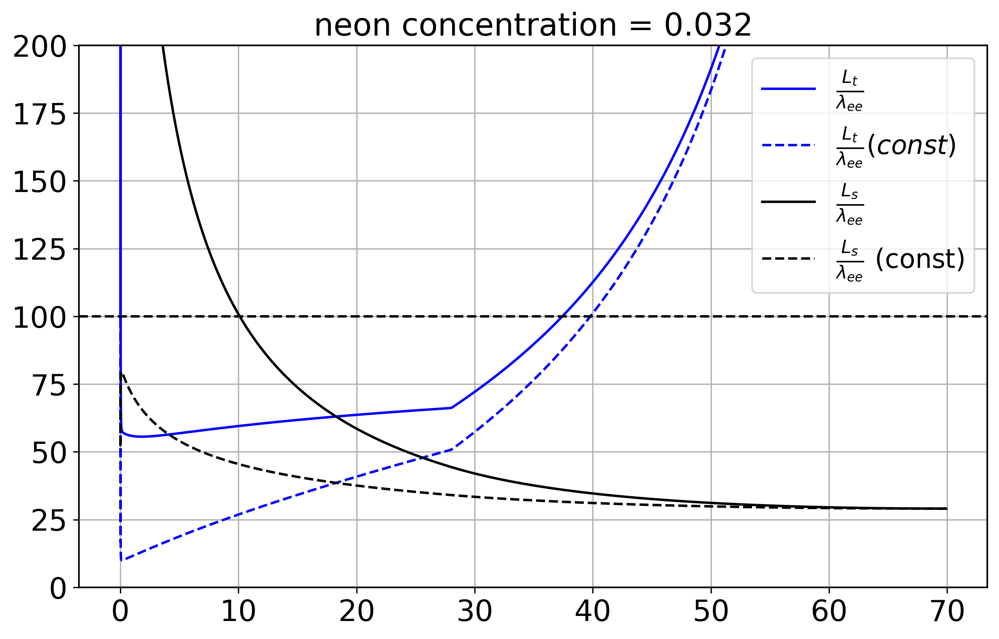

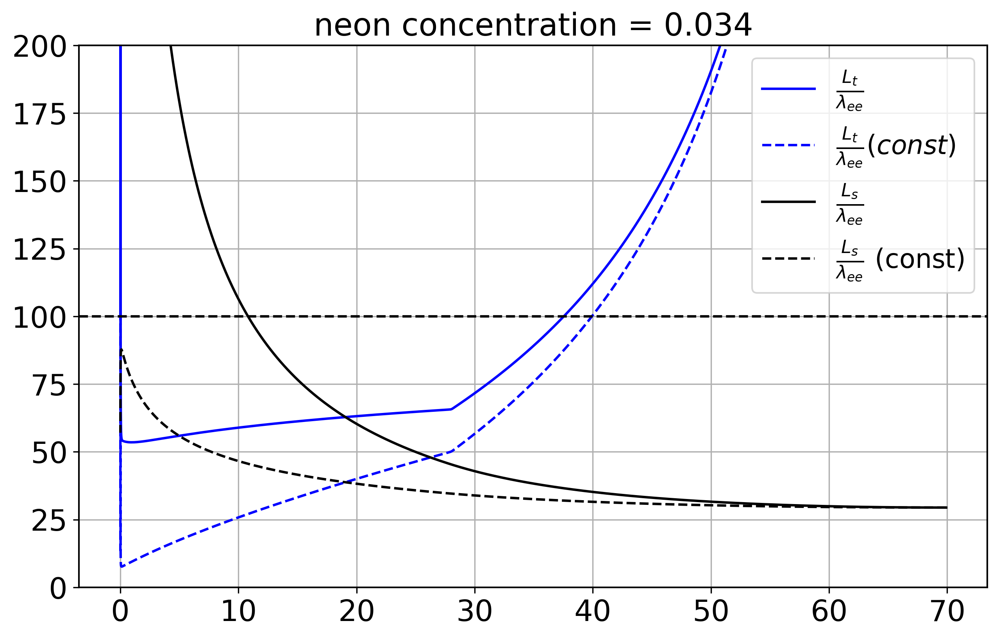

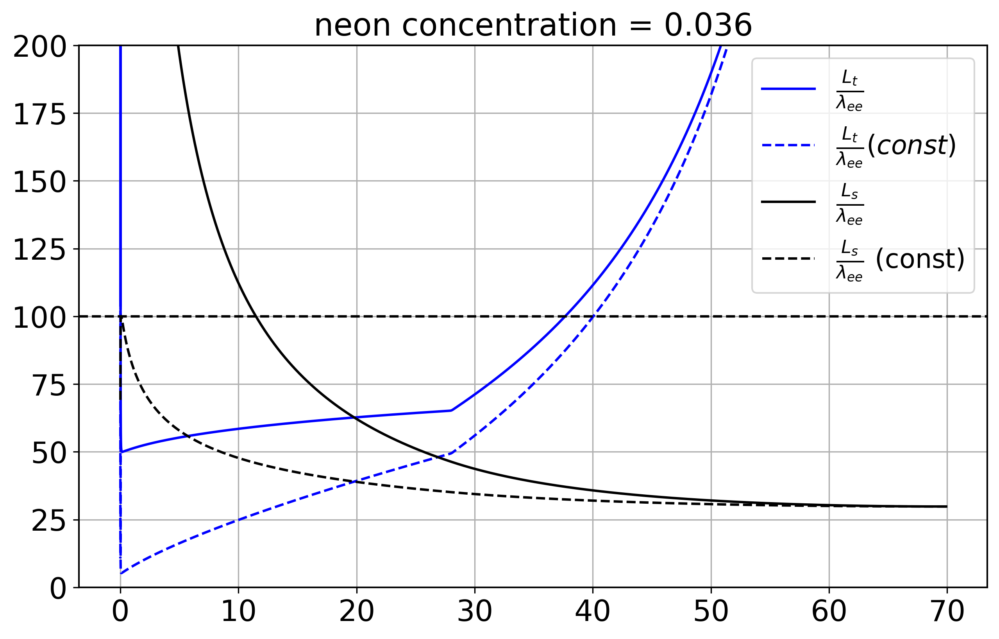

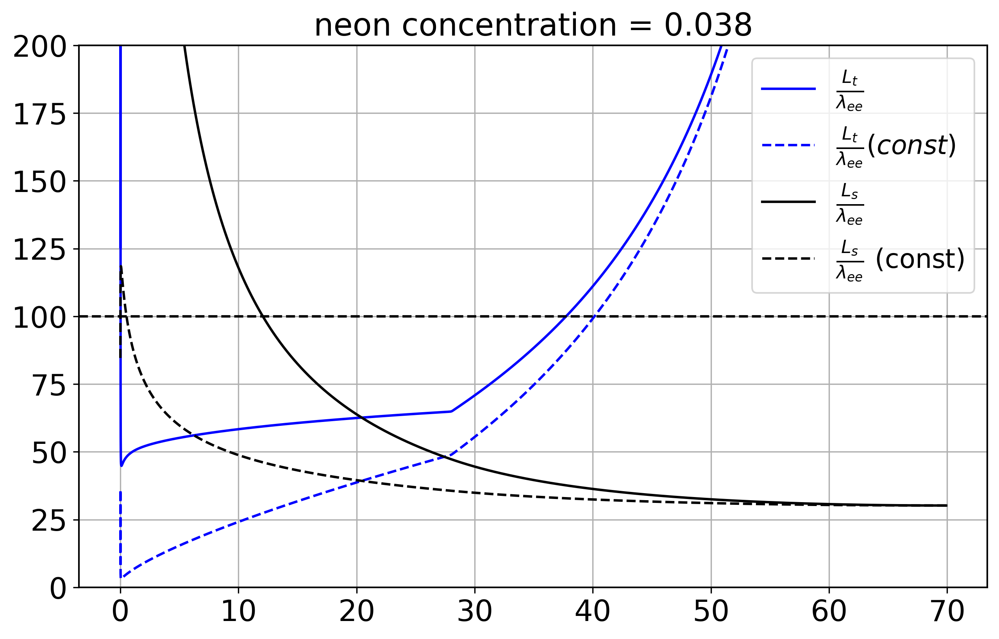

...

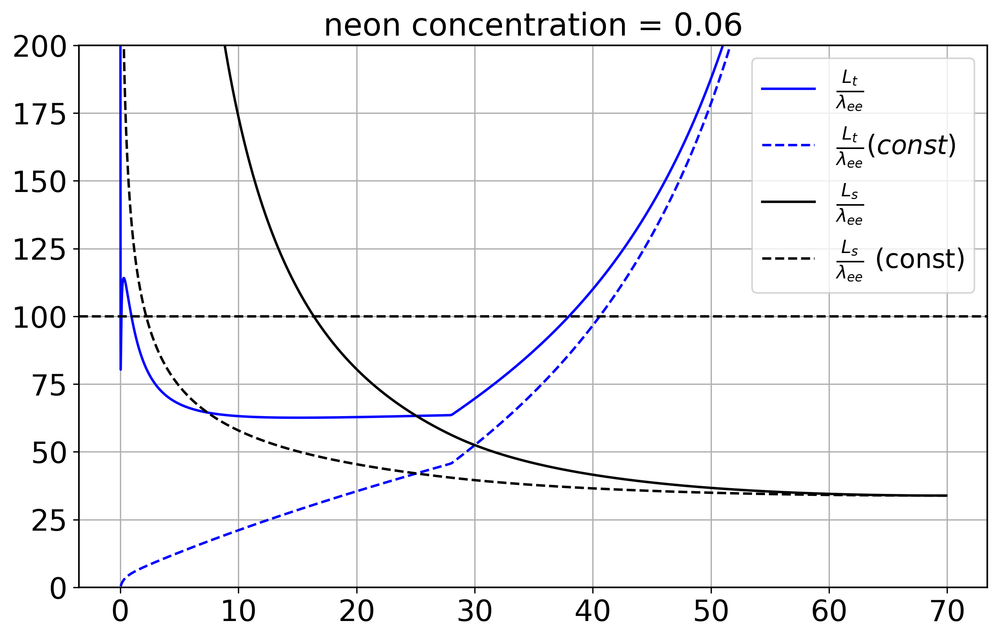

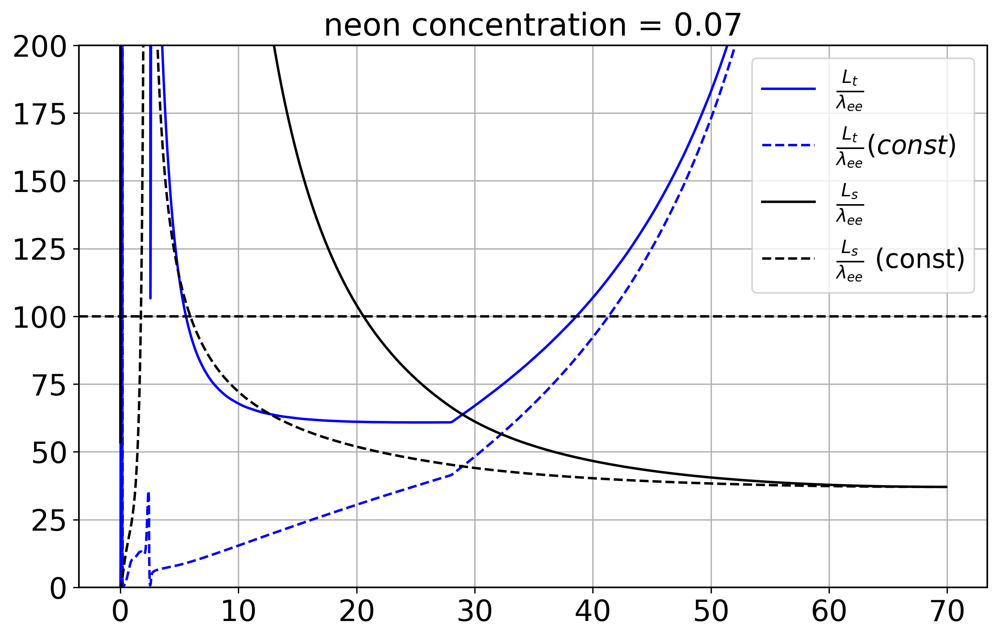

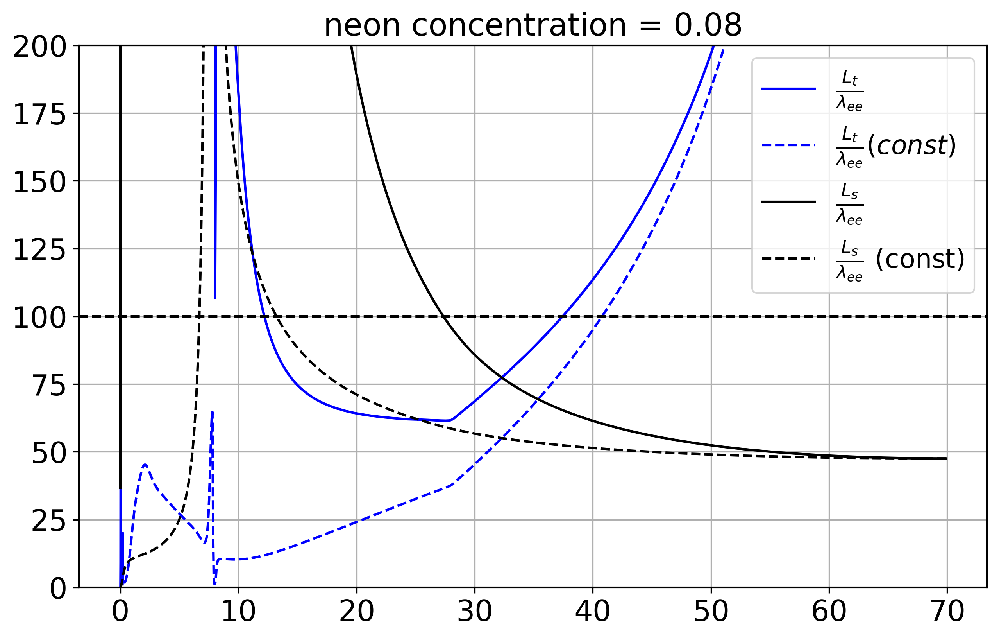

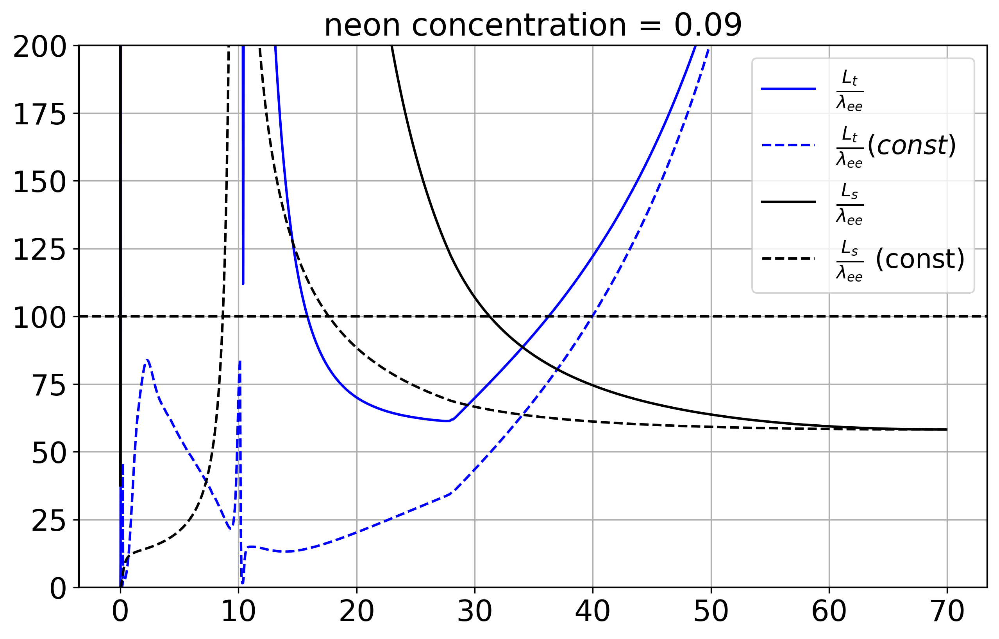

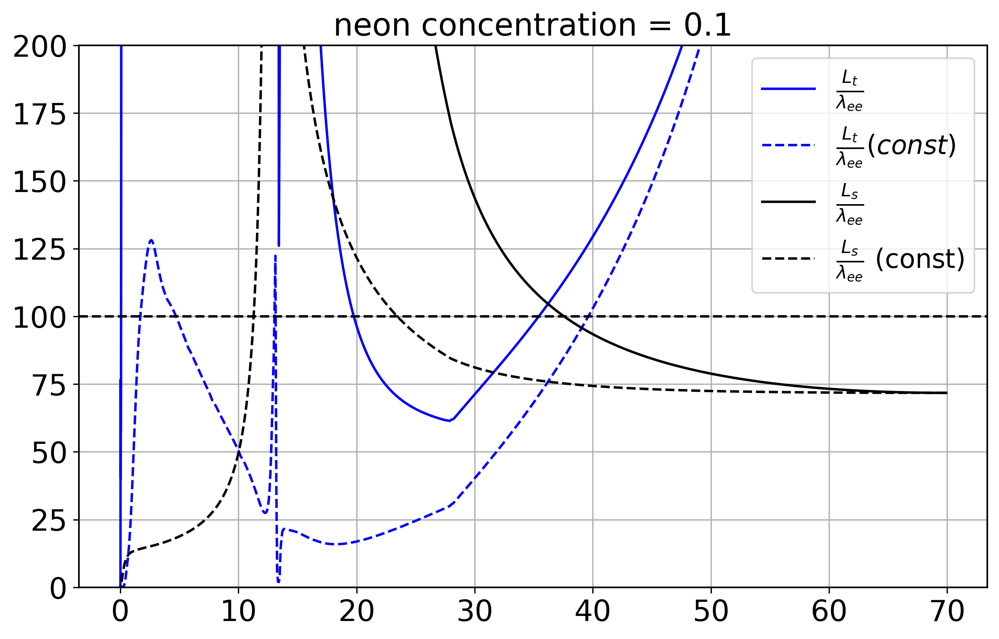

In [7]:
neon_vals = np.array([0.03,0.032,0.034,0.036,0.038, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1])

for i in neon_vals:


    j = '0.2'
    

    Te = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'].values[2:-2]
    y = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2]
    Ne = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'].values[2:-2]

    lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    Ls = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])


    y_flipped = (cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2].max() - cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])

    grad_T = np.gradient(Te, y_flipped)
    Lt = np.abs(Te/grad_T)

    lt_over_lambda = (Lt/lambda_ee)
    ls_over_lambda = (Ls/lambda_ee)

    # using constant upstream temperature
    lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    lt_over_lambda_const = (Lt/lambda_ee_const)
    ls_over_lambda_const = (Ls/lambda_ee_const)

    knudsen = lambda_ee/Lt


    fig,ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)
    # ax2 = ax.twinx()
    # ax.plot(y_flipped, grad_T, linestyle='-', color='black', label='dTe/dy', markersize=5)
    # ax2.plot(y_flipped, Lt, linestyle='-', color='red', label='Lt', markersize=5)
    # ax.plot(y_flipped, knudsen, linestyle='-', color='blue', label='Te', markersize=5)
    # ax.plot(y_flipped, Te, linestyle='-', color='blue', label='Te', markersize=5)
    # ax.plot(y_flipped, lambda_ee, linestyle='-', color='green', label=r'$\lambda_{ee}$', markersize=5)
    ax.plot(y_flipped, lt_over_lambda, linestyle='-', color='blue', label=r'$\frac{L_t}{\lambda_{ee}}$', markersize=5)
    ax.plot(y_flipped, lt_over_lambda_const, linestyle='--', color='blue', label=r'$\frac{L_t}{\lambda_{ee}} (const)$', markersize=5)
    
    ax.plot(y_flipped, ls_over_lambda, linestyle='-', color='black', label=r'$\frac{L_s}{\lambda_{ee}}$', markersize=5)
    ax.plot(y_flipped, ls_over_lambda_const, linestyle='--', color='black', label=r'$\frac{L_s}{\lambda_{ee}}$ (const)', markersize=5)
    ax.axhline(100, color='black', linestyle='--')



    ax.legend()

    ax.set_ybound(0,200)
    ax.set_title(f'neon concentration = {i}')

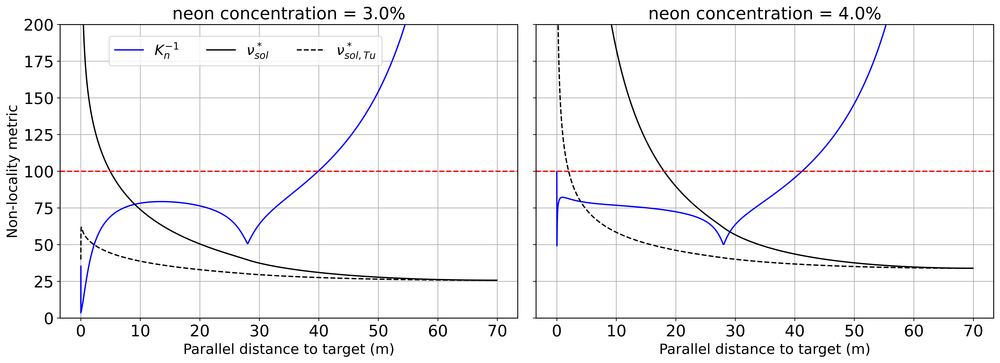

In [8]:

# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10



# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})


import numpy as np
import matplotlib.pyplot as plt

# Select specific neon values for the two subplots
neon_vals = [0.03, 0.04]

# Create figure with two subplots sharing y-axis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=500, sharey=True)
axes = [ax1, ax2]

for idx, i in enumerate(neon_vals):
    j = 'snb'
    
    Te = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'].values[2:-2]
    y = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2]
    Ne = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'].values[2:-2]

    lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    Ls = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])

    y_flipped = (cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2].max() - cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])

    grad_T = np.gradient(Te, y_flipped)
    Lt = np.abs(Te/grad_T)

    lt_over_lambda = (Lt/lambda_ee)
    ls_over_lambda = (Ls/lambda_ee)

    # using constant upstream temperature
    lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    lt_over_lambda_const = (Lt/lambda_ee_const)
    ls_over_lambda_const = (Ls/lambda_ee_const)

    knudsen = lambda_ee/Lt

    # Plot on the corresponding subplot
    ax = axes[idx]
    
    ax.plot(y_flipped, lt_over_lambda, linestyle='-', color='blue', label=r'$K_n^{-1}$', markersize=5)
    # ax.plot(y_flipped, lt_over_lambda_const, linestyle='--', color='blue', label=r'$\frac{L_t}{\lambda_{e,Tu}} $', markersize=5)
    
    ax.plot(y_flipped, ls_over_lambda, linestyle='-', color='black', label=r'$\nu_{sol}^*$', markersize=5)
    ax.plot(y_flipped, ls_over_lambda_const, linestyle='--', color='black', label=r'$\nu_{sol, Tu}^*$ ', markersize=5)
    ax.axhline(100, color='red', linestyle='--')

    # ax.legend()
    ax.set_ybound(0, 200)
    ax.set_title(f'neon concentration = {i*100}%')
    ax.set_xlabel('Parallel distance to target (m)')
    
    # Only set y-label on the left subplot
    if idx == 0:
        ax.set_ylabel('Non-locality metric')


handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.25, 0.90), ncol=3)

plt.savefig('neon_collsionality_comparison.svg', format='svg')
plt.savefig('neon_collsionality_comparison.png', format='png', dpi=500)

plt.tight_layout()
plt.show()

802 802 802
802 802 802


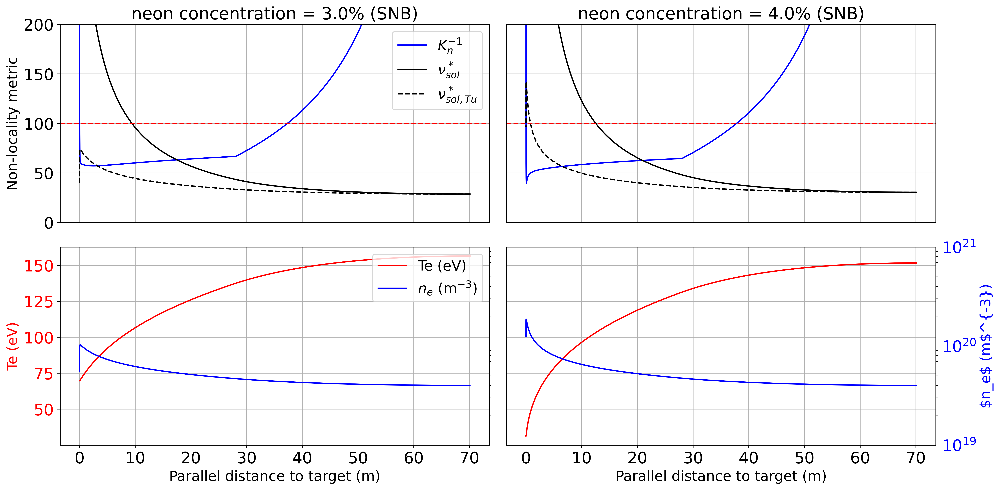

In [9]:
# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10

# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})

import numpy as np
import matplotlib.pyplot as plt

# Select specific neon values for the two subplots
neon_vals = [0.03, 0.04]

# Create figure with 2x2 subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 8), dpi=500)

# Share axes - NOW FLIPPED
ax1.sharey(ax2)  # Share non-locality y-axis (now on top)
ax3.sharey(ax4)  # Share temperature y-axis (now on bottom)

# Create twin axes for density (now on bottom row)
ax3_ne = ax3.twinx()
ax4_ne = ax4.twinx()
ax3_ne.sharey(ax4_ne)  # Share density y-axis

for idx, i in enumerate(neon_vals):
    j = '0.2'
    
    Te = replace_guards(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'])
    y = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2]
    Ne = replace_guards(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'])

    lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    Ls = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])

    y_flipped = (cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[1:-1].max() - cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[1:-1])

    print(len(y_flipped), len(Te), len(Ne))

    grad_T = np.gradient(Te, y_flipped)
    Lt = np.abs(Te/grad_T)

    lt_over_lambda = (Lt/lambda_ee)
    ls_over_lambda = (Ls/lambda_ee)

    # using constant upstream temperature
    lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    lt_over_lambda_const = (Lt/lambda_ee_const)
    ls_over_lambda_const = (Ls/lambda_ee_const)

    # FLIPPED: Top row - Non-locality metrics
    if idx == 0:
        ax_top, ax_temp, ax_ne = ax1, ax3, ax3_ne
    else:
        ax_top, ax_temp, ax_ne = ax2, ax4, ax4_ne

    # Top row - Non-locality metrics (moved from bottom)
    ax_top.plot(y_flipped, lt_over_lambda, '-', color='blue', label=r'$K_n^{-1}$')
    ax_top.plot(y_flipped, ls_over_lambda, '-', color='black', label=r'$\nu_{sol}^*$')
    ax_top.plot(y_flipped, ls_over_lambda_const, '--', color='black', label=r'$\nu_{sol, Tu}^*$')
    ax_top.axhline(100, color='red', linestyle='--')

    ax_top.set_ylim(0, 200)
    ax_top.set_title(f'neon concentration = {i*100}% (SNB)')
    
    # Remove x-axis ticks and labels for top plots
    ax_top.set_xticklabels([])
    ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    if idx == 0:
        ax_top.set_ylabel('Non-locality metric')
        ax_top.legend(loc='upper right')
    if idx == 1:
        ax_top.tick_params(axis='y', left=False, labelleft=False)

    # Bottom row - Temperature and density profiles (moved from top)
    ax_temp.plot(y_flipped, Te, '-', color='red', label='Te (eV)')
    ax_ne.plot(y_flipped, Ne, '-', color='blue', label=r'$n_e$ (m$^{-3}$)')

    # Set density axis to log scale
    ax_ne.set_yscale('log')
    ax_ne.set_ybound(1e19, 1e21)
    ax_ne.grid(False)
    
    # Set colors and labels - only on left subplot for shared axes
    if idx == 0:
        ax_temp.set_ylabel('Te (eV)', color='red')
        ax_temp.tick_params(axis='y', labelcolor='red')
        # Remove secondary y-axis ticks for lower left
        ax_ne.tick_params(axis='y', right=False, labelright=False)
    else:
        ax_ne.set_ylabel(r'$n_e$ (m$^{-3})', color='blue')
        ax_ne.tick_params(axis='y', labelcolor='blue')
        # Remove primary y-axis ticks for lower right
        ax_temp.tick_params(axis='y', left=False, labelleft=False)
    
    # Only set x-labels on bottom plots
    ax_temp.set_xlabel('Parallel distance to target (m)')
    
    # Legend only on first subplot
    if idx == 0:
        lines1, labels1 = ax_temp.get_legend_handles_labels()
        lines2, labels2 = ax_ne.get_legend_handles_labels()
        ax_temp.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()
plt.savefig('neon_collsionality_comparison.svg', format='svg')
plt.savefig('neon_collsionality_comparison.png', format='png', dpi=500)
plt.show()

802 802 802
802 802 802


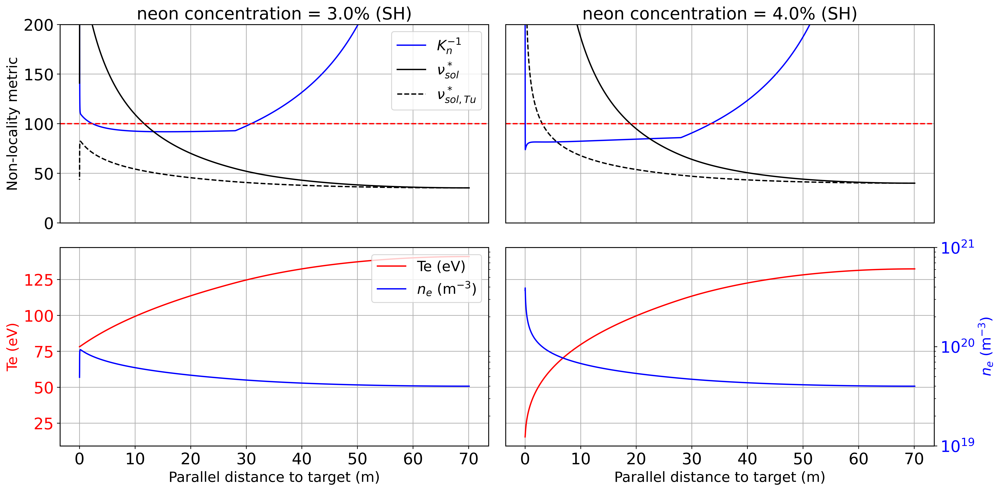

In [ ]:
# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10

# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})

import numpy as np
import matplotlib.pyplot as plt

# Select specific neon values for the two subplots
neon_vals = [0.03, 0.04]

# Create figure with 2x2 subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 8), dpi=500)

# Share axes - NOW FLIPPED
ax1.sharey(ax2)  # Share non-locality y-axis (now on top)
ax3.sharey(ax4)  # Share temperature y-axis (now on bottom)

# Create twin axes for density (now on bottom row)
ax3_ne = ax3.twinx()
ax4_ne = ax4.twinx()
ax3_ne.sharey(ax4_ne)  # Share density y-axis

for idx, i in enumerate(neon_vals):
    j = '0.2'

    if j == '-1':
        title = 'SH'
    elif j == '0.2':
        title = r'\alpha = 0.2'
    elif j == 'snb':
        title = 'SNB'
    
    Te = replace_guards(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'])
    y = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2]
    Ne = replace_guards(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'])

    lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    Ls = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])

    y_flipped = (cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[1:-1].max() - cs[f'alpha_0.2_neon_{i}'].ds.isel(t=-1)['pos'].values[1:-1])

    print(len(y_flipped), len(Te), len(Ne))

    grad_T = np.gradient(Te, y_flipped)
    Lt = np.abs(Te/grad_T)

    lt_over_lambda = (Lt/lambda_ee)
    ls_over_lambda = (Ls/lambda_ee)

    # using constant upstream temperature
    lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
    lt_over_lambda_const = (Lt/lambda_ee_const)
    ls_over_lambda_const = (Ls/lambda_ee_const)

    # FLIPPED: Top row - Non-locality metrics
    if idx == 0:
        ax_top, ax_temp, ax_ne = ax1, ax3, ax3_ne
    else:
        ax_top, ax_temp, ax_ne = ax2, ax4, ax4_ne

    # Top row - Non-locality metrics (moved from bottom)
    ax_top.plot(y_flipped, lt_over_lambda, '-', color='blue', label=r'$K_n^{-1}$')
    ax_top.plot(y_flipped, ls_over_lambda, '-', color='black', label=r'$\nu_{sol}^*$')
    ax_top.plot(y_flipped, ls_over_lambda_const, '--', color='black', label=r'$\nu_{sol, Tu}^*$')
    ax_top.axhline(100, color='red', linestyle='--')

    ax_top.set_ylim(0, 200)
    ax_top.set_title(f'neon concentration = {i*100}% ({title})')
    
    # Remove x-axis ticks and labels for top plots
    ax_top.set_xticklabels([])
    ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    if idx == 0:
        ax_top.set_ylabel('Non-locality metric')
        ax_top.legend(loc='upper right')
    if idx == 1:
        ax_top.tick_params(axis='y', left=False, labelleft=False)

    # Bottom row - Temperature and density profiles (moved from top)
    ax_temp.plot(y_flipped, Te, '-', color='red', label='Te (eV)')
    ax_ne.plot(y_flipped, Ne, '-', color='blue', label=r'$n_e$ (m$^{-3}$)')

    # Set density axis to log scale
    ax_ne.set_yscale('log')
    ax_ne.set_ybound(1e19, 1e21)
    ax_ne.grid(False)
    
    # Set colors and labels - only on left subplot for shared axes
    if idx == 0:
        ax_temp.set_ylabel('Te (eV)', color='red')
        ax_temp.tick_params(axis='y', labelcolor='red')
        # Remove secondary y-axis ticks for lower left
        ax_ne.tick_params(axis='y', right=False, labelright=False)
    else:
        ax_ne.set_ylabel(r'$n_e$ (m$^{-3}$)', color='blue')
        ax_ne.tick_params(axis='y', labelcolor='blue')
        # Remove primary y-axis ticks for lower right
        ax_temp.tick_params(axis='y', left=False, labelleft=False)
    
    # Only set x-labels on bottom plots
    ax_temp.set_xlabel('Parallel distance to target (m)')
    
    # Legend only on first subplot
    if idx == 0:
        lines1, labels1 = ax_temp.get_legend_handles_labels()
        lines2, labels2 = ax_ne.get_legend_handles_labels()
        ax_temp.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()
plt.savefig('neon_collsionality_comparison.svg', format='svg')
plt.savefig('neon_collsionality_comparison.png', format='png', dpi=500)
plt.show()

Model: SH, Neon: 3.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SNB, Neon: 3.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SH, Neon: 4.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SNB, Neon: 4.0% - Lengths: y_flipped=802, Te=802, Ne=802


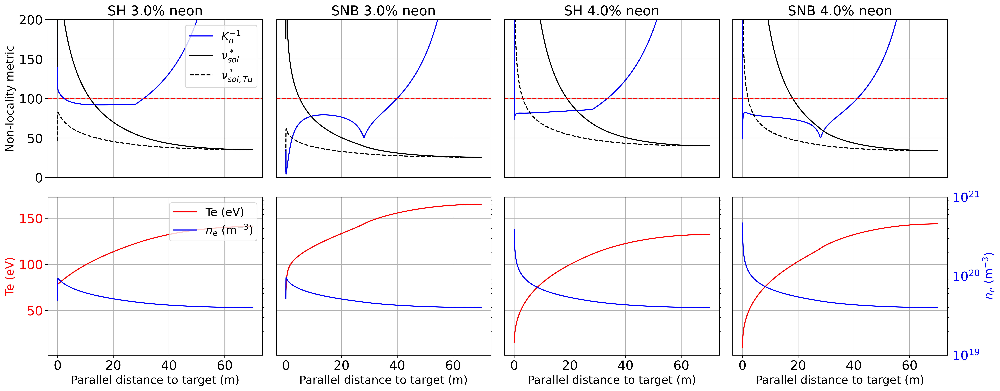

In [9]:
# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10

# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})

import numpy as np
import matplotlib.pyplot as plt

# Select specific neon values and models
neon_vals = [0.03, 0.04]
models = ['-1', 'snb']  # SH and SNB models
model_names = ['SH', 'SNB']

# Create figure with 2x4 subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 8), dpi=500)

# Share y-axes within rows
# Top row (non-locality metrics)
for col in range(1, 4):
    axes[0, col].sharey(axes[0, 0])
# Bottom row (temperature) - we'll handle density separately
for col in range(1, 4):
    axes[1, col].sharey(axes[1, 0])

# Create twin axes for density (bottom row)
density_axes = []
for col in range(4):
    ax_ne = axes[1, col].twinx()
    density_axes.append(ax_ne)
    if col > 0:
        ax_ne.sharey(density_axes[0])

# Loop through models and neon concentrations
col_idx = 0
for neon_idx, neon_conc in enumerate(neon_vals):
    for model_idx, model in enumerate(models):
        j = model
        
        # Determine title based on model
        if j == '-1':
            model_title = 'SH'
        elif j == 'snb':
            model_title = 'SNB'
        else:
            model_title = f'α = {j}'
        
        # Get data
        Te = replace_guards(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['Te'])
        y = cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[2:-2]
        Ne = replace_guards(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['Ne'])

        # Calculate non-locality metrics
        lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
        Ls = np.max(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[2:-2])

        y_flipped = (cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[1:-1].max() - cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[1:-1])

        print(f"Model: {model_title}, Neon: {neon_conc*100}% - Lengths: y_flipped={len(y_flipped)}, Te={len(Te)}, Ne={len(Ne)}")

        grad_T = np.gradient(Te, y_flipped)
        Lt = np.abs(Te/grad_T)

        lt_over_lambda = (Lt/lambda_ee)
        ls_over_lambda = (Ls/lambda_ee)

        # using constant upstream temperature
        lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
        lt_over_lambda_const = (Lt/lambda_ee_const)
        ls_over_lambda_const = (Ls/lambda_ee_const)

        # Get current axes
        ax_top = axes[0, col_idx]
        ax_temp = axes[1, col_idx]
        ax_ne = density_axes[col_idx]

        # Top row - Non-locality metrics
        ax_top.plot(y_flipped, lt_over_lambda, '-', color='blue', label=r'$K_n^{-1}$')
        ax_top.plot(y_flipped, ls_over_lambda, '-', color='black', label=r'$\nu_{sol}^*$')
        ax_top.plot(y_flipped, ls_over_lambda_const, '--', color='black', label=r'$\nu_{sol, Tu}^*$')
        ax_top.axhline(100, color='red', linestyle='--')

        ax_top.set_ylim(0, 200)
        ax_top.set_title(f'{model_title} {neon_conc*100}% neon')
        
        # Remove x-axis ticks and labels for top plots
        ax_top.set_xticklabels([])
        ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        
        # Y-label only on leftmost plot
        if col_idx == 0:
            ax_top.set_ylabel('Non-locality metric')
            ax_top.legend(loc='upper right')
        else:
            ax_top.tick_params(axis='y', left=False, labelleft=False)

        # Bottom row - Temperature and density profiles
        ax_temp.plot(y_flipped, Te, '-', color='red', label='Te (eV)')
        ax_ne.plot(y_flipped, Ne, '-', color='blue', label=r'$n_e$ (m$^{-3}$)')

        # Set density axis to log scale
        ax_ne.set_yscale('log')
        ax_ne.set_ybound(1e19, 1e21)
        ax_ne.grid(False)
        
        # Set colors and labels
        if col_idx == 0:
            ax_temp.set_ylabel('Te (eV)', color='red')
            ax_temp.tick_params(axis='y', labelcolor='red')
            # Remove secondary y-axis ticks for leftmost
            ax_ne.tick_params(axis='y', right=False, labelright=False)
        elif col_idx == 3:  # Rightmost plot
            ax_ne.set_ylabel(r'$n_e$ (m$^{-3}$)', color='blue')
            ax_ne.tick_params(axis='y', labelcolor='blue')
            # Remove primary y-axis ticks for rightmost
            ax_temp.tick_params(axis='y', left=False, labelleft=False)
        else:  # Middle plots
            # Remove both primary and secondary y-axis ticks
            ax_temp.tick_params(axis='y', left=False, labelleft=False)
            ax_ne.tick_params(axis='y', right=False, labelright=False)
        
        # Set x-labels on bottom plots
        ax_temp.set_xlabel('Parallel distance to target (m)')
        
        # Legend only on first subplot
        if col_idx == 0:
            lines1, labels1 = ax_temp.get_legend_handles_labels()
            lines2, labels2 = ax_ne.get_legend_handles_labels()
            ax_temp.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

        col_idx += 1

plt.tight_layout()
plt.savefig('neon_SH_SNB_comparison.svg', format='svg')
plt.savefig('neon_SH_SNB_comparison.png', format='png', dpi=500)
plt.show()

In [11]:
# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 10

# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})

import numpy as np
import matplotlib.pyplot as plt

# Select specific neon values and models
neon_vals = [0.03, 0.04]
models = ['-1', '0.2', 'snb']  # SH, alpha=0.2, and SNB models
model_names = ['SH', 'α=0.2', 'SNB']

# Create figure with 2x6 subplots
fig, axes = plt.subplots(2, 6, figsize=(30, 8), dpi=500)

# Share y-axes within rows
# Top row (non-locality metrics)
for col in range(1, 6):
    axes[0, col].sharey(axes[0, 0])
# Bottom row (temperature) - we'll handle density separately
for col in range(1, 6):
    axes[1, col].sharey(axes[1, 0])

# Create twin axes for density (bottom row)
density_axes = []
for col in range(6):
    ax_ne = axes[1, col].twinx()
    density_axes.append(ax_ne)
    if col > 0:
        ax_ne.sharey(density_axes[0])

# Loop through neon concentrations and models
col_idx = 0
for neon_idx, neon_conc in enumerate(neon_vals):
    for model_idx, model in enumerate(models):
        j = model
        
        # Determine title based on model
        if j == '-1':
            model_title = 'SH'
        elif j == 'snb':
            model_title = 'SNB'
        elif j == '0.2':
            model_title = r'α = 0.2'
        else:
            model_title = f'α = {j}'
        
        # Get data
        Te = replace_guards(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['Te'])
        y = cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[2:-2]
        Ne = replace_guards(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['Ne'])

        # Calculate non-locality metrics
        lambda_ee = ((Te**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
        Ls = np.max(cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[2:-2])

        y_flipped = (cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[1:-1].max() - cs[f'alpha_{j}_neon_{neon_conc}'].ds.isel(t=-1)['pos'].values[1:-1])

        print(f"Model: {model_title}, Neon: {neon_conc*100}% - Lengths: y_flipped={len(y_flipped)}, Te={len(Te)}, Ne={len(Ne)}")

        grad_T = np.gradient(Te, y_flipped)
        Lt = np.abs(Te/grad_T)

        lt_over_lambda = (Lt/lambda_ee)
        ls_over_lambda = (Ls/lambda_ee)

        # using constant upstream temperature
        lambda_ee_const = ((Te[2]**2) * 10**(16) / Ne) / np.sqrt(2*np.pi)
        lt_over_lambda_const = (Lt/lambda_ee_const)
        ls_over_lambda_const = (Ls/lambda_ee_const)

        # Get current axes
        ax_top = axes[0, col_idx]
        ax_temp = axes[1, col_idx]
        ax_ne = density_axes[col_idx]

        # Top row - Non-locality metrics
        ax_top.plot(y_flipped, lt_over_lambda, '-', color='blue', label=r'$K_n^{-1}$')
        ax_top.plot(y_flipped, ls_over_lambda, '-', color='black', label=r'$\nu_{sol}^*$')
        ax_top.plot(y_flipped, ls_over_lambda_const, '--', color='black', label=r'$\nu_{sol, Tu}^*$')
        ax_top.axhline(100, color='red', linestyle='--')

        ax_top.set_ylim(0, 200)
        ax_top.set_title(f'{model_title} {neon_conc*100}% neon')
        
        # Remove x-axis ticks and labels for top plots
        ax_top.set_xticklabels([])
        ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        
        # Y-label only on leftmost plot
        if col_idx == 0:
            ax_top.set_ylabel('Non-locality metric')
            ax_top.legend(loc='upper right')
        else:
            ax_top.tick_params(axis='y', left=False, labelleft=False)

        # Bottom row - Temperature and density profiles
        ax_temp.plot(y_flipped, Te, '-', color='red', label='Te (eV)')
        ax_ne.plot(y_flipped, Ne, '-', color='blue', label=r'$n_e$ (m$^{-3}$)')

        # Set density axis to log scale
        ax_ne.set_yscale('log')
        ax_ne.set_ybound(1e19, 1e21)
        ax_ne.grid(False)
        
        # Set colors and labels
        if col_idx == 0:
            ax_temp.set_ylabel('Te (eV)', color='red')
            ax_temp.tick_params(axis='y', labelcolor='red')
            # Remove secondary y-axis ticks for leftmost
            ax_ne.tick_params(axis='y', right=False, labelright=False)
        elif col_idx == 5:  # Rightmost plot
            ax_ne.set_ylabel(r'$n_e$ (m$^{-3}$)', color='blue')
            ax_ne.tick_params(axis='y', labelcolor='blue')
            # Remove primary y-axis ticks for rightmost
            ax_temp.tick_params(axis='y', left=False, labelleft=False)
        else:  # Middle plots
            # Remove both primary and secondary y-axis ticks
            ax_temp.tick_params(axis='y', left=False, labelleft=False)
            ax_ne.tick_params(axis='y', right=False, labelright=False)
        
        # Set x-labels on bottom plots
        ax_temp.set_xlabel('Parallel distance to target (m)')
        
        # Legend only on first subplot
        if col_idx == 0:
            lines1, labels1 = ax_temp.get_legend_handles_labels()
            lines2, labels2 = ax_ne.get_legend_handles_labels()
            ax_temp.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

        col_idx += 1

plt.tight_layout()
plt.savefig('neon_SH_SNB_alpha02_comparison.svg', format='svg')
plt.savefig('neon_SH_SNB_alpha02_comparison.png', format='png', dpi=500)
plt.show()

Model: SH, Neon: 3.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: α = 0.2, Neon: 3.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SNB, Neon: 3.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SH, Neon: 4.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: α = 0.2, Neon: 4.0% - Lengths: y_flipped=802, Te=802, Ne=802
Model: SNB, Neon: 4.0% - Lengths: y_flipped=802, Te=802, Ne=802


# Constant upstream temperature

In [11]:
import math

def calculate_sol_collisionality(L, n_u, T_u):
    """
    Calculate the SOL collisionality using equation (17).
    
    Parameters:
    L (float): Length in meters
    n_u (float): Upstream density in m^-3
    T_u (float): Upstream temperature in eV
    
    Returns:
    float: SOL collisionality v*_SOL
    """
    
    # Constants from the formula
    beta_constant = 1.5e54 / math.sqrt(2 * math.log(15))  # β = 1.5×10^54 / √(2ln(Λ))
    
    # Calculate the velocity using equation (17)
    # v*_SOL = (L * n_u) / (β * T_u^2) ≈ 5.5 * L(m) * (n_u / 10^20 m^-3) * (100eV / T_u)^2
    
    # Using the approximation formula
    v_sol_approx = 5.5 * L * (n_u / 1e20) * (100 / T_u)**2
    
    # Using the exact formula
    v_sol_exact = (L * n_u) / (beta_constant * T_u**2)
    
    return v_sol_approx, v_sol_exact, beta_constant

# Example calculation with sample parameters
print("SOL collisionality Calculator")
print("=" * 40)

# Example parameters (you can modify these)
# L = 1.0  # Length in meters
L = np.max(cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['pos'].values[2:-2])
n_u = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Ne'].values[2:-2][0]
T_u = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'].values[2:-2][0]


Te_upstream = cs[f'alpha_{j}_neon_{i}'].ds.isel(t=-1)['Te'].values[2:-2][0]

print(f"Input parameters:")
print(f"Length (L): {L} m")
print(f"Upstream density (n_u): {n_u:.2e} m^-3")
print(f"Upstream temperature (T_u): {T_u} eV")
print()

# Calculate collisionality
v_approx, v_exact, beta = calculate_sol_collisionality(L, n_u, T_u)

print(f"Calculated SOL collisionality (approx): {v_approx:.2e}")
print(f"Calculated SOL collisionality (exact): {v_exact:.2e}")
print(f"Beta constant: {beta:.2e}")

SOL collisionality Calculator
Input parameters:
Length (L): 69.99562500000017 m
Upstream density (n_u): 4.00e+19 m^-3
Upstream temperature (T_u): 143.88100683146604 eV

Calculated SOL collisionality (approx): 7.44e+01
Calculated SOL collisionality (exact): 2.10e-37
Beta constant: 6.45e+53
